<a href="https://colab.research.google.com/github/MeiByeleth/AIMathBook/blob/master/signate_risyoku.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install signate

  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9657 sha256=76bc8ebd0d7950e109da5f1d5646d6813ec02ef97dd9a6ae303a474b6edf4ac9
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget


In [2]:
!pip install signate

from googleapiclient.discovery import build
import io, os
from googleapiclient.http import MediaIoBaseDownload
from google.colab import auth


auth.authenticate_user()

drive_service = build('drive', 'v3')
results = drive_service.files().list(
        q="name = 'signate.json'", fields="files(id)").execute()
signate_api_key = results.get('files', [])

filename = "/root/.signate/signate.json"
os.makedirs(os.path.dirname(filename), exist_ok=True)

request = drive_service.files().get_media(fileId=signate_api_key[0]['id'])
fh = io.FileIO(filename, 'wb')
downloader = MediaIoBaseDownload(fh, request)
done = False
while done is False:
    status, done = downloader.next_chunk()
    print("Download %d%%." % int(status.progress() * 100))
os.chmod(filename, 600)

Download 100%.


In [3]:
! signate list

  competitionId  title                                                                             closing     prize        submitters
---------------  --------------------------------------------------------------------------------  ----------  ---------  ------------
              1  【練習問題】銀行の顧客ターゲティング                                              -                              6754
             24  【練習問題】お弁当の需要予測                                                      -                              8150
             27  【練習問題】Jリーグの観客動員数予測                                               -                              1960
            100  【練習問題】手書き文字認識                                                        -           Knowledge           300
            102  【練習問題】タイタニックの生存予測                                                -           Knowledge          2206
            103  【練習問題】音楽ラベリング                                                        -           Knowledge           154
            

In [4]:
!signate files --competition-id=752

  fileId  name               title                               size  updated_at
--------  -----------------  --------------------------------  ------  -------------------
    1999  train.csv          学習用データ                      203884  2021-04-26 14:16:27
    2000  test.csv           評価用データ                      134479  2021-04-26 14:16:37
    2001  sample_submit.csv  サンプルサブミッション用ファイル    5135  2021-04-26 14:16:46


In [5]:
!signate download --competition-id=752 --file-id=1999
!signate download --competition-id=752 --file-id=2000
!signate download --competition-id=752 --file-id=2001

train.csv


Download completed.
test.csv


Download completed.
sample_submit.csv


Download completed.


In [6]:
!ls

sample_data  sample_submit.csv	test.csv  train.csv


In [7]:
import pandas as pd

train_df=pd.read_csv("train.csv")
test_df=pd.read_csv("test.csv")
sample_df=pd.read_csv("sample_submit.csv")

In [8]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 34 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   id                        1200 non-null   int64  
 1   Age                       1200 non-null   int64  
 2   BusinessTravel            1200 non-null   object 
 3   DailyRate                 1200 non-null   float64
 4   Department                1200 non-null   object 
 5   DistanceFromHome          1200 non-null   float64
 6   Education                 1200 non-null   int64  
 7   EducationField            1200 non-null   object 
 8   EmployeeNumber            1200 non-null   int64  
 9   EnvironmentSatisfaction   1200 non-null   int64  
 10  Gender                    1200 non-null   object 
 11  HourlyRate                1200 non-null   int64  
 12  JobInvolvement            1200 non-null   int64  
 13  JobLevel                  1200 non-null   int64  
 14  JobRole 

,1,0
0,2,0
1,4,0
2,5,0
3,6,0
4,8,0


In [11]:
!pip install pandas-profiling
import pandas as pd
import pandas_profiling as pdp

pdp.ProfileReport(train_df)


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 353.0/353.0 kB 31.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 11.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 43.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 27.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.4/455.4 kB 33.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 46.6 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=118fe0f1455a8909c6c050f774f0134705fcf04062020b6638d4c8dcccebfeb0
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: wordcloud
    Found existing installation: wordcloud 1.8.2.2
    Uninstalling wordc

<ipython-input-11-e802d1c44019>:3: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling as pdp


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<ipython-input-15-e48f643ae58c>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrmat = train_df.corr()


<Axes: >

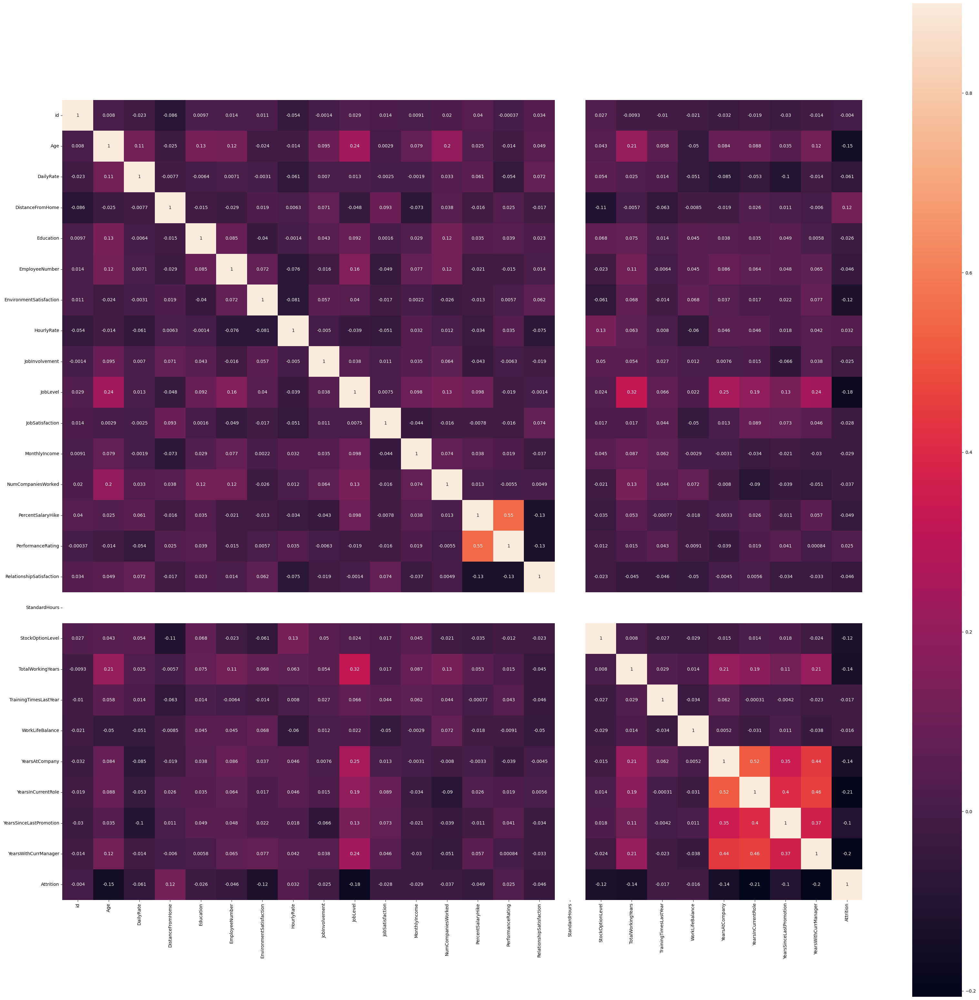

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns
corrmat = train_df.corr()
plt.subplots(figsize=(40,40))
sns.heatmap(corrmat, vmax=0.9, square=True, annot=True)

# 上記データから読み取れる内容
- job level はTotalWorkingYearsと関連ありそう
-


# 仮説
- DistanceFromHomeが多いほど離職率UP
- EnvironmentSatisfaction	int	雇用満足度(1 'Low' 2 'Medium' 3 'High' 4 'Very High') が高いほど離職率下がる
- HourlyRate	int	時間給 は一定のところまで離職率へ影響あるが、それ以上は影響なし
- ジョブホッパーは一定の数を超えると離職率に影響する(仮説）
- RelationshipSatisfaction	int	社内での交流満足度　が高いと離職率下がる
-

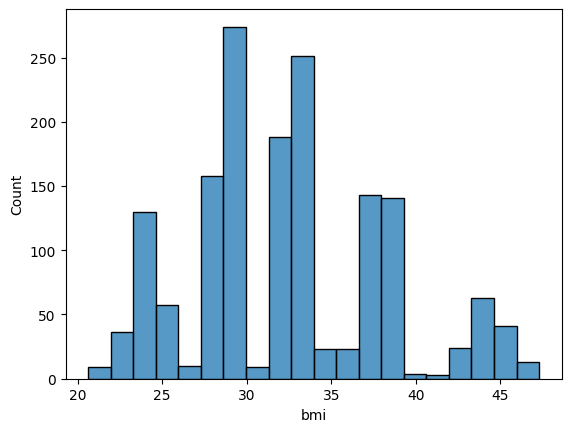

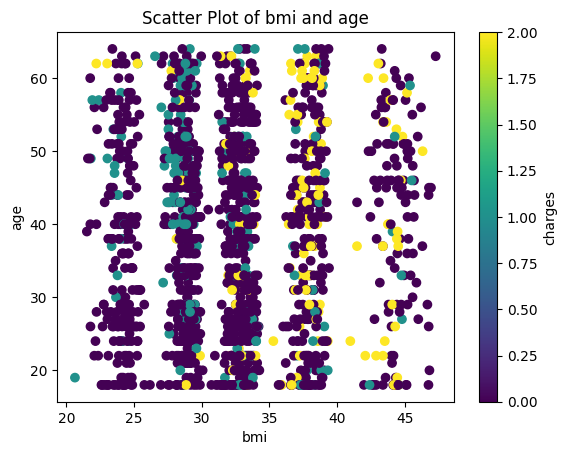

In [ ]:
import matplotlib.pyplot as plt

plt.scatter(train_df["bmi"], train_df["age"], c=train_df["charges"])
plt.colorbar(label="charges")
plt.xlabel("bmi")
plt.ylabel("age")
plt.title("Scatter Plot of bmi and age")
plt.show()


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 21.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for umap-learn: filename=umap_learn-0.5.3-py3-none-any.whl size=82816 sha256=075a0be0a16aad0e3db95a33abb37bf4007cd2e7dcdc44211f7f1c68beabeb18
  Stored in directory: /root/.cache/pip/wheels/a0/e8/c6/a37ea663620bd5200ea1ba0907ab3c217042c1d035ef606acc
  Created wheel for pynndescent: filename=pynndescent-0.5.10-py3-none-any.whl size=55622 sha256=7adc3a9d11e47209115ca91249b780116fa99e0d62304bf780a0f409e411cc43
  Stored in directory: /root/.cache/pip/wheels/4a/38/5d/f60a40a66a9512b7e5e83517ebc2d1b42d857be97d135f1096
Successfully built umap-learn pynndescent


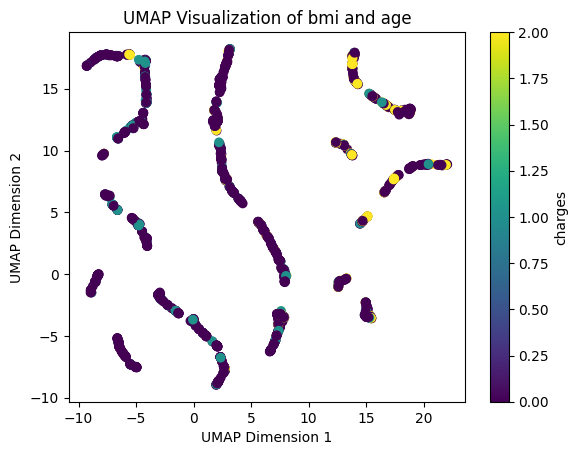

In [ ]:
!pip install umap-learn
import umap
import matplotlib.pyplot as plt

# UMAPのインスタンスを作成
umap_model = umap.UMAP()

# データをUMAPで次元削減
umap_embedding = umap_model.fit_transform(train_df[["bmi", "age"]])

# 可視化
plt.scatter(umap_embedding[:, 0], umap_embedding[:, 1], c=train_df["charges"])
plt.colorbar(label="charges")
plt.xlabel("UMAP Dimension 1")
plt.ylabel("UMAP Dimension 2")
plt.title("UMAP Visualization of bmi and age")
plt.show()


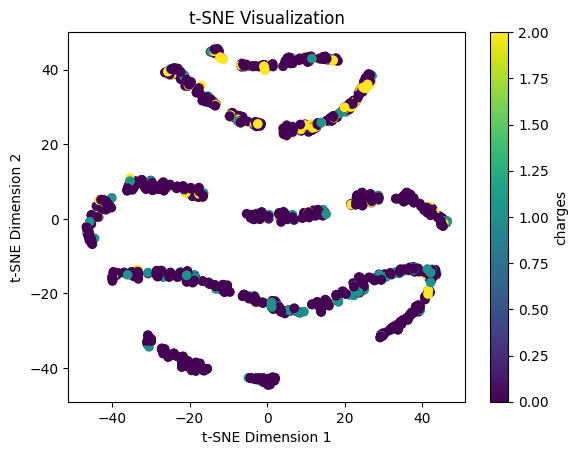

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# t-SNEを適用するデータ
data = train_df[['bmi', 'age']]

# t-SNEのインスタンスを作成し、次元削減を実行
tsne = TSNE(n_components=2, random_state=0)
embedded_data = tsne.fit_transform(data)

# 可視化
plt.scatter(embedded_data[:, 0], embedded_data[:, 1], c=train_df['charges'], cmap='viridis')
plt.colorbar(label='charges')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.title('t-SNE Visualization')
plt.show()


In [ ]:
cross_table_region = pd.crosstab(train_df['region'], train_df['charges'])
print(cross_table_region)

charges      0   1   2
region                
northeast  332  49  33
northwest  328  57  18
southeast  287  52  69
southwest  309  40  26


In [ ]:
cross_table_child = pd.crosstab(train_df['children'], train_df['charges'])
print(cross_table_child)

charges     0   1   2
children             
0         617  89  77
1         295  41  14
2         173  25  32
3         115  32  20
4          24  11   3
5          32   0   0


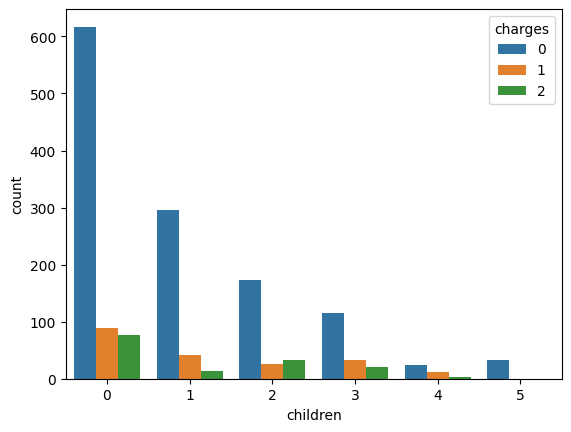

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.countplot(x='children', hue='charges', data=train_df)
plt.show()

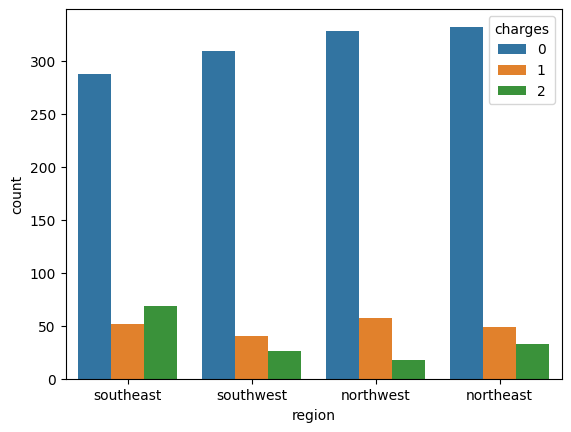

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.countplot(x='region', hue='charges', data=train_df)
plt.show()

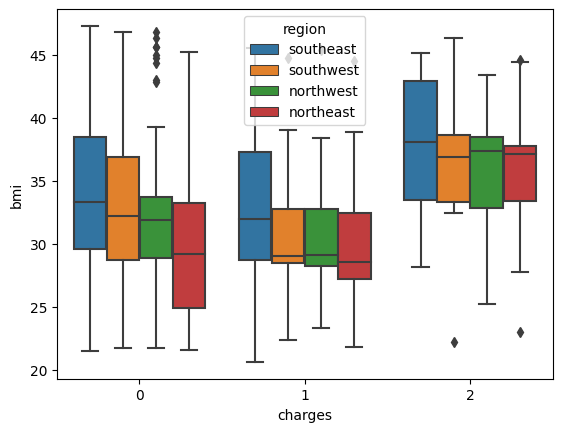

In [ ]:
import seaborn as sns
sns.boxplot(x='charges', y='bmi', hue= 'region', data=train_df)
plt.show()

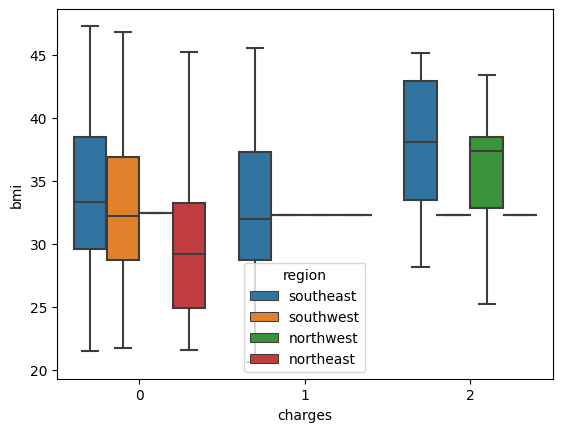

In [ ]:
train_df=pd.read_csv("train.csv")

# 代替値の計算
bmi_mean = train_df['bmi'].mean()
bmi_median = train_df['bmi'].median()

# 代替値の設定
train_df.loc[(train_df['charges'] == 0) & (train_df['region'] == 'northwest'), 'bmi'] = bmi_mean
train_df.loc[(train_df['charges'] == 1) & (train_df['region'].isin(['northwest', 'southwest', 'northeast'])), 'bmi'] = bmi_median
train_df.loc[(train_df['charges'] == 2) & (train_df['region'].isin(['southwest', 'northeast'])), 'bmi'] = bmi_median



# 外れ値が取り除かれたデータを可視化
sns.boxplot(x='charges', y='bmi', hue='region', data=train_df)
plt.show()


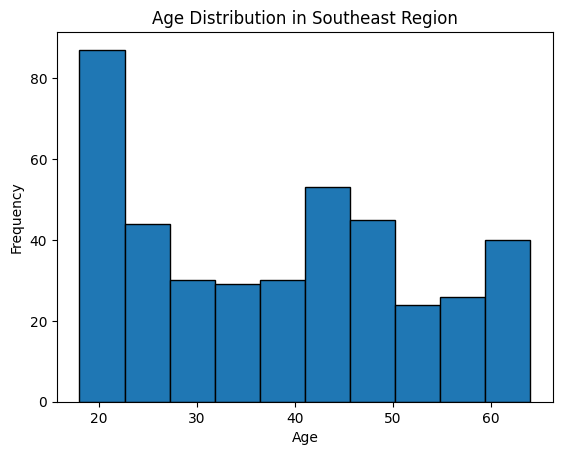

In [ ]:
import matplotlib.pyplot as plt

southeast_data = train_df[train_df['region'] == 'southeast']
age_data = southeast_data['age']

plt.hist(age_data, bins=10, edgecolor='black')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Age Distribution in Southeast Region')
plt.show()



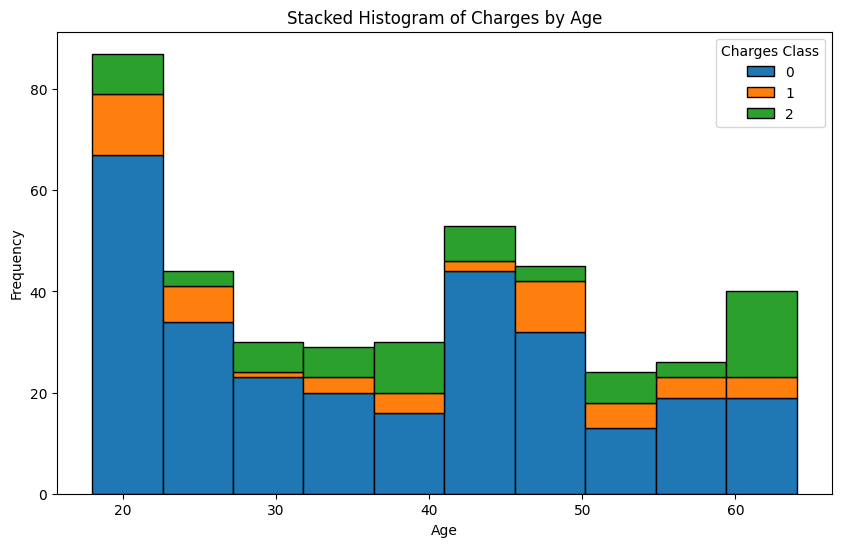

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# データの取得
southeast_data = train_df[train_df['region'] == 'southeast']
southwest_data = train_df[train_df['region'] == 'southwest']
northeast_data = train_df[train_df['region'] == 'northeast']
northwest_data = train_df[train_df['region'] == 'northwest']

# chargesのクラスごとの頻度を計算
southeast_charges = southeast_data['charges'].value_counts()
southwest_charges = southwest_data['charges'].value_counts()
northeast_charges = northeast_data['charges'].value_counts()
northwest_charges = northwest_data['charges'].value_counts()

# chargesのクラスを取得
charges_classes = sorted(train_df['charges'].unique())

# 積み上げヒストグラムを作成
plt.figure(figsize=(10, 6))
plt.hist([southeast_data[southeast_data['charges'] == c]['age'] for c in charges_classes], bins=10, stacked=True, label=charges_classes, edgecolor='black')

plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Stacked Histogram of Charges by Age')
plt.legend(title='Charges Class')
plt.show()


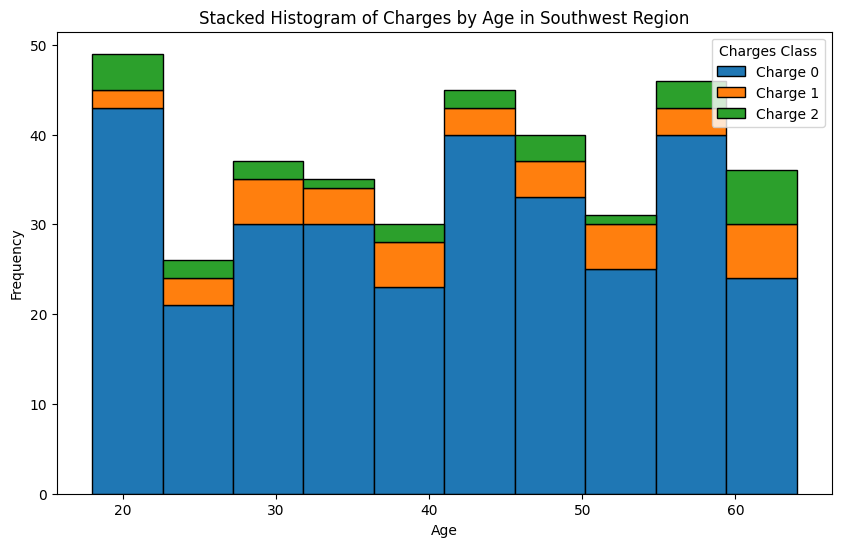

In [ ]:
import matplotlib.pyplot as plt

southwest_data = train_df[train_df['region'] == 'southwest']

# chargesのクラスごとのデータを取得
charge_0 = southwest_data[southwest_data['charges'] == 0]['age']
charge_1 = southwest_data[southwest_data['charges'] == 1]['age']
charge_2 = southwest_data[southwest_data['charges'] == 2]['age']

# 積み上げヒストグラムを作成
plt.figure(figsize=(10, 6))
plt.hist([charge_0, charge_1, charge_2], bins=10, stacked=True, label=['Charge 0', 'Charge 1', 'Charge 2'], edgecolor='black')

plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Stacked Histogram of Charges by Age in Southwest Region')
plt.legend(title='Charges Class')
plt.show()

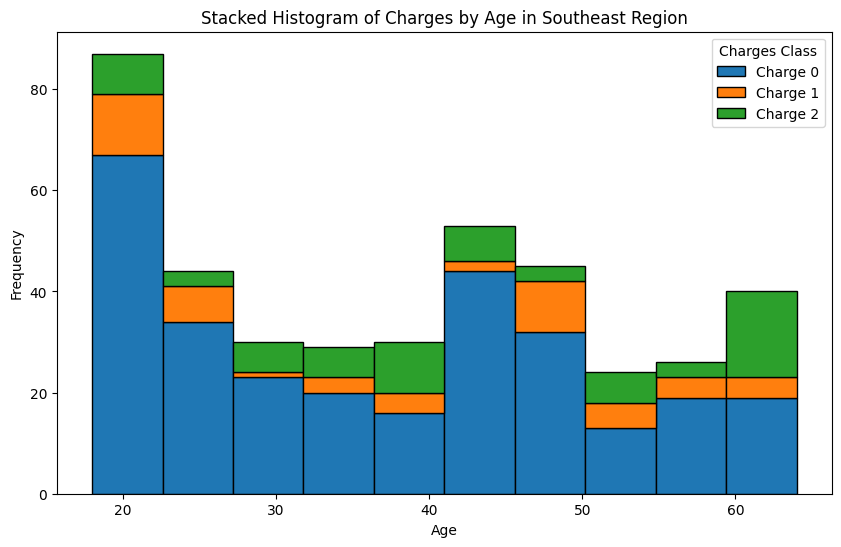

In [ ]:
import matplotlib.pyplot as plt

southeast_data = train_df[train_df['region'] == 'southeast']

# chargesのクラスごとのデータを取得
charge_0 = southeast_data[southeast_data['charges'] == 0]['age']
charge_1 = southeast_data[southeast_data['charges'] == 1]['age']
charge_2 = southeast_data[southeast_data['charges'] == 2]['age']

# 積み上げヒストグラムを作成
plt.figure(figsize=(10, 6))
plt.hist([charge_0, charge_1, charge_2], bins=10, stacked=True, label=['Charge 0', 'Charge 1', 'Charge 2'], edgecolor='black')

plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Stacked Histogram of Charges by Age in Southeast Region')
plt.legend(title='Charges Class')
plt.show()


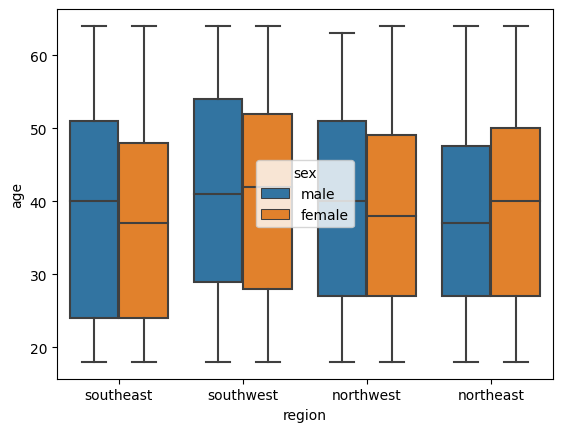

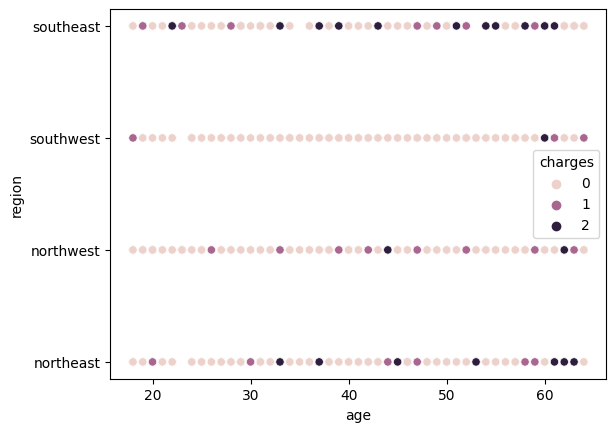

In [ ]:
import seaborn as sns
sns.boxplot(x='region', y='age', hue= 'sex', data=train_df)
plt.show()

sns.scatterplot(x='age', y='region', hue='charges', data=train_df)
plt.show()

In [ ]:
cross_table_age = pd.crosstab(train_df['age'], train_df['charges'])
print(cross_table_age)
from scipy.stats import chi2_contingency

chi2, p, dof, expected = chi2_contingency(cross_table_age)
print("カイ二乗統計量:", chi2)
print("p値:", p)

charges   0   1   2
age                
18       93  13   6
19       21   3   2
20       20   4   1
21       23   0   0
22       52   5  10
23        1   2   1
24       45   5   5
25       18   1   0
26       43   2   2
27       37   5   1
28       43   6   1
29       40   3   4
30        9   1   0
31       30   2   7
32       17   1   0
33       27   9  10
34       26   4   1
35        5   0   0
36       26   0   1
37       20   6   6
38       46   4   2
39        9   4   1
40       34  11   8
41       50   2   2
42       14   4   1
43       27   5   3
44       24   4   7
45       39   3   2
46       42   3   3
47        8  14   1
48       20   3   2
49       29   9   1
50       44   8   7
51       34   1   2
52       16  15   3
53       10   3   1
54       29   4   5
55       17   2   2
56       29   1   0
57       16   4   3
58       22   1   2
59       22   5   1
60       17   2   9
61        7   2   5
62       35   6  11
63       11   1   4
64        9   5   0
カイ二乗統計量: 258.9631418

In [ ]:
cross_table_region = pd.crosstab(train_df['sex'], train_df['charges'])
print(cross_table_region)

charges    0    1    2
sex                   
female   629   87   43
male     627  111  103


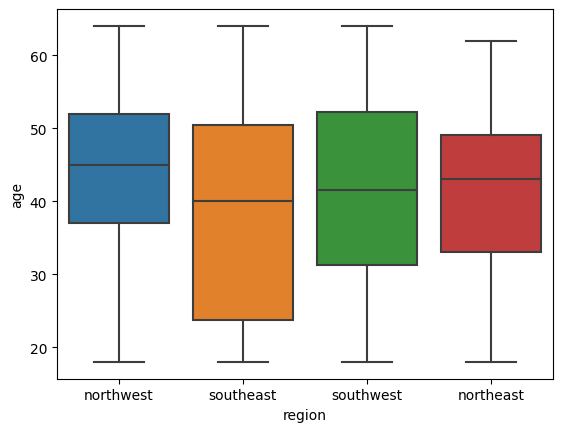

In [ ]:
sns.boxplot(x='region', y='age', data=train_df[train_df['charges'] == 1])
plt.show()

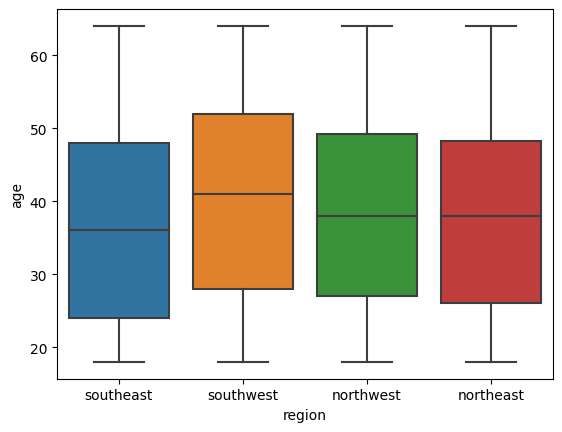

In [ ]:
sns.boxplot(x='region', y='age', data=train_df[train_df['charges'] == 0])
plt.show()

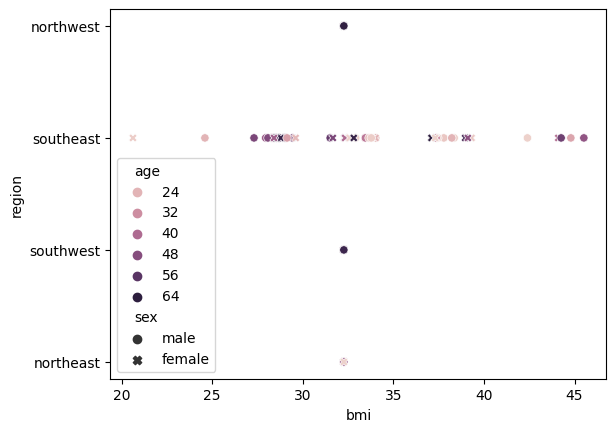

In [ ]:
sns.scatterplot(x='bmi', y='region', hue='age', style='sex', data=train_df[train_df['charges'] == 1])
plt.show()


In [ ]:
from scipy.stats import chi2_contingency

chi2, p, dof, expected = chi2_contingency(cross_table_age)
print("カイ二乗統計量:", chi2)
print("p値:", p)

カイ二乗統計量: 258.963141892884
p値: 8.341104947923765e-18


## 特徴量エンジニアリング

```python

              precision    recall  f1-score   support

           0       0.93      0.97      0.95       249
           1       0.58      0.44      0.50        32
           2       0.87      0.85      0.86        39

    accuracy                           0.90       320
   macro avg       0.80      0.75      0.77       320
weighted avg       0.89      0.90      0.89       320
```
が最大値



In [ ]:
all_df = pd.get_dummies(train_df)
all_df=all_df.drop(columns=['id','smoker_no','sex_female'])
print(all_df)

      age        bmi  children  charges  sex_male  smoker_yes  \
0      26  32.665465         3        0         1           0   
1      41  29.798725         1        0         1           0   
2      28  32.268786         0        1         1           1   
3      20  38.429831         2        0         0           0   
4      45  32.424376         1        0         0           0   
...   ...        ...       ...      ...       ...         ...   
1595   52  32.772830         0        0         1           0   
1596   29  32.424376         0        0         1           0   
1597   56  43.281979         1        0         0           0   
1598   51  32.424376         1        0         1           1   
1599   54  32.424376         0        0         0           0   

      region_northeast  region_northwest  region_southeast  region_southwest  
0                    0                 0                 1                 0  
1                    0                 0                 0   

In [ ]:
all_df = train_df

import pandas as pd

# "region_category" 列を作成
all_df['region_category'] = 0  # まずは全ての行を 0 に設定

# "southeast" の場合は -1、"northeast" の場合は 1 に設定
all_df.loc[all_df['region'] == 'southeast', 'region_category'] = -1
all_df.loc[all_df['region'] == 'northeast', 'region_category'] = 1

print(all_df)

all_df=all_df.drop(columns=['region'])

all_df = pd.get_dummies(all_df)

all_df=all_df.drop(columns=['id','smoker_no','sex_female'])
print(all_df)



        id  age     sex        bmi  children smoker     region  charges  \
0        0   26    male  32.665465         3     no  southeast        0   
1        1   41    male  29.798725         1     no  southwest        0   
2        2   28    male  32.268786         0    yes  northwest        1   
3        3   20  female  38.429831         2     no  southeast        0   
4        4   45  female  32.424376         1     no  northwest        0   
...    ...  ...     ...        ...       ...    ...        ...      ...   
1595  1994   52    male  32.772830         0     no  southwest        0   
1596  1996   29    male  32.424376         0     no  northwest        0   
1597  1997   56  female  43.281979         1     no  southeast        0   
1598  1998   51    male  32.424376         1    yes  northwest        0   
1599  1999   54  female  32.424376         0     no  northwest        0   

      region_category  
0                  -1  
1                   0  
2                   0  
3  

子供が2人の時だけフラグを立てたら精度下がった。


```python

# 子供が2人の時だけフラグを立てる
# all_df['children_2'] = np.where(all_df['children'] == 2, 1, 0)

#all_df=all_df.drop(columns=['children'])
--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.97      0.95       249
           1       0.56      0.44      0.49        32
           2       0.86      0.82      0.84        39

    accuracy                           0.90       320
   macro avg       0.79      0.74      0.76       320
weighted avg       0.89      0.90      0.89       320
```

In [ ]:
print(all_df)

# 新しい列を作成
#all_df['age_for1'] = np.where(((all_df['age'] <= 27) | ((46 <= all_df['age']) & (all_df['age'] <= 50))) & (all_df['region_southeast'] == 1), 1, 0)
#all_df=all_df.drop(columns=['age'])

      age        bmi  children  charges  region_category  sex_male  smoker_yes
0      26  32.665465         3        0               -1         1           0
1      41  29.798725         1        0                0         1           0
2      28  32.268786         0        1                0         1           1
3      20  38.429831         2        0               -1         0           0
4      45  32.424376         1        0                0         0           0
...   ...        ...       ...      ...              ...       ...         ...
1595   52  32.772830         0        0                0         1           0
1596   29  32.424376         0        0                0         1           0
1597   56  43.281979         1        0               -1         0           0
1598   51  32.424376         1        0                0         1           1
1599   54  32.424376         0        0                0         0           0

[1600 rows x 7 columns]


In [ ]:
#  bins = [18, 31, 45, 58,100]
#  labels = ['18-31', '32-45', '46-58', '58+']
#  all_df['age_group'] = pd.cut(train['age'], bins=bins, labels=labels)
#  all_df = pd.get_dummies(all_df)

<Axes: >

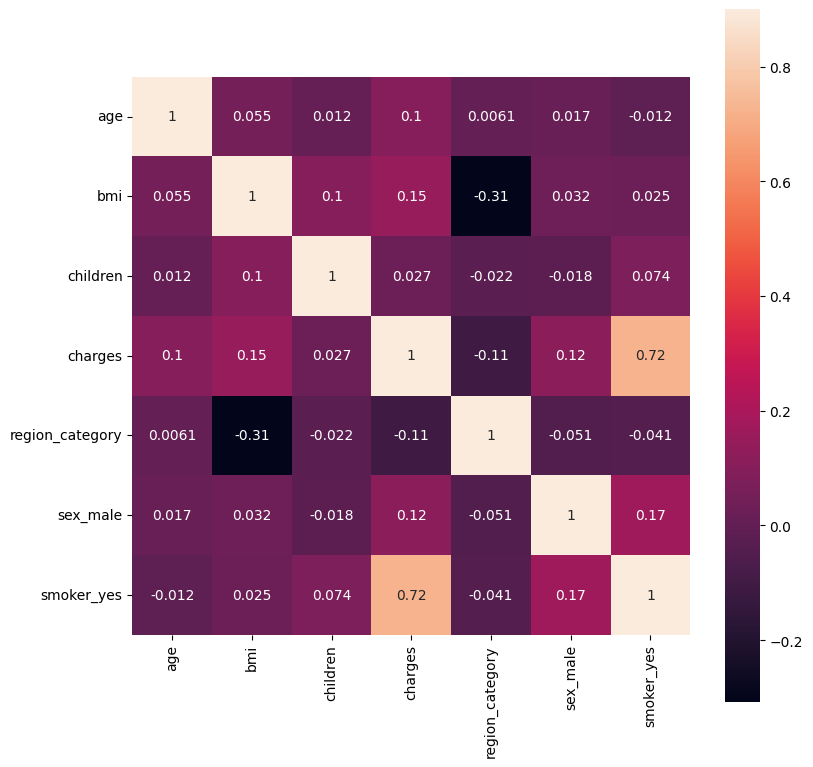

In [ ]:

corrmat = all_df.corr()
plt.subplots(figsize=(9,9))
sns.heatmap(corrmat, vmax=0.9, square=True, annot=True)

In [ ]:
#all_df['health_risk_estimate'] = all_df['bmi'] + all_df['smoker_yes']

In [ ]:

# # PCAを適用するデータ
# data = all_df[['bmi', 'age','smoker_yes']]


# from sklearn.decomposition import PCA
# # PCAのインスタンスを作成し、次元削減を実行
# pca = PCA(n_components=3, random_state=0)
# embedded_data = pca.fit_transform(data)

# # 可視化
# plt.scatter(embedded_data[:, 0], embedded_data[:, 1], c=all_df['charges'], cmap='viridis')
# plt.colorbar(label='charges')
# plt.xlabel('PC1')
# plt.ylabel('PC2')
# plt.title('PCA Visualization')
# plt.show()

# all_df["bmi"]=embedded_data[:, 0]
# all_df["age"]=embedded_data[:, 1]
# all_df["smoker_yes"]=embedded_data[:, 2]

In [ ]:
from sklearn.metrics import f1_score
import xgboost as xgb
import lightgbm as lgb

In [ ]:
# モデル作成
model_xgb = xgb.XGBClassifier()



all_df.info()



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1600 entries, 0 to 1599
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   age              1600 non-null   int64  
 1   bmi              1600 non-null   float64
 2   children         1600 non-null   int64  
 3   charges          1600 non-null   int64  
 4   region_category  1600 non-null   int64  
 5   sex_male         1600 non-null   uint8  
 6   smoker_yes       1600 non-null   uint8  
dtypes: float64(1), int64(4), uint8(2)
memory usage: 65.8 KB


In [ ]:
!pip install optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.6/390.6 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 20.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 8.0 MB/s eta 0:00:00


## light gbmの場合

In [ ]:
# 提出
all_df_test = test


# "region_category" 列を作成
all_df_test['region_category'] = 0  # まずは全ての行を 0 に設定

# "southeast" の場合は -1、"northeast" の場合は 1 に設定
all_df_test.loc[all_df_test['region'] == 'southeast', 'region_category'] = -1
all_df_test.loc[all_df_test['region'] == 'northeast', 'region_category'] = 1

all_df_test=all_df_test.drop(columns=['region'])

all_df_test = pd.get_dummies(all_df_test)

all_df_test=all_df_test.drop(columns=['id','smoker_no','sex_female'])
print(all_df_test)

     age        bmi  children  region_category  sex_male  smoker_yes
0     19  24.365178         1                1         1           0
1     59  33.997763         0                1         1           1
2     42  29.283450         0                0         0           0
3     30  24.903725         1                0         1           0
4     41  29.644536         0                0         0           0
..   ...        ...       ...              ...       ...         ...
395   47  24.915980         1                0         0           0
396   18  44.752922         0               -1         0           0
397   33  37.203015         0               -1         0           1
398   29  33.617369         1                0         1           0
399   37  32.722320         3                0         0           0

[400 rows x 6 columns]


In [ ]:
import optuna
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.metrics import  classification_report
import numpy as np
import lightgbm as lgb

train_df=pd.read_csv("train.csv")
# 特徴エンジニアリング
all_df = train_df

import pandas as pd

# "region_category" 列を作成
all_df['region_category'] = 0  # まずは全ての行を 0 に設定
# "southeast" の場合は -1、"northeast" の場合は 1 に設定
all_df.loc[all_df['region'] == 'southeast', 'region_category'] = -1
all_df.loc[all_df['region'] == 'northeast', 'region_category'] = 1
all_df=all_df.drop(columns=['region'])

all_df = pd.get_dummies(all_df)
all_df=all_df.drop(columns=['id','smoker_no','sex_female'])
print(all_df)


target = all_df['charges']
train = all_df.drop(columns='charges')

# 今までと同様にクロスバリデーションでモデルを評価します
cv = KFold(n_splits=3, random_state=0, shuffle=True)
val_acc_list = []

# ハイパーパラメータを定義
lgb_params = {
    'boosting_type': 'gbdt', #勾配ブースティング決定木
    'objective': 'multiclass', #目的：多値分類
    'num_class': 3, #分類クラス数
    'metric': 'multiclass', #評価指標は多クラスのLog損失
    "force_row_wise" : True,
    "seed" : 0,
    'learning_rate': 0.04718715793648069,
    'min_data_in_leaf': 5,
    "min_child_samples": 15,
    "max_depth":3
    }

model_lgb = lgb.LGBMClassifier()
model_lgb.set_params(**lgb_params)

    # KFold で学習させる
for i ,(trn_index, val_index) in enumerate(cv.split(train, target)):

    print(f'Fold : {i}')
    # データ全体(Xとy)を学習データと評価データに分割
    X_train ,X_val ,y_train ,y_val = train_test_split(
    train, target, test_size=0.2,random_state=0 )
    print(y_train.head(20))
    # LigthGBM用のデータセットを定義
    model_lgb.fit(X_train, y_train)

    y_pred_val = model_lgb.predict(X_val)
    # print(y_pred_val)

    print(y_pred_val)


    print(y_val)
    val_acc = f1_score(
    y_val, y_pred_val, average = "macro"
    )
    print('\n--------------- Classification Report ---------------\n')
    print(classification_report(y_val, y_pred_val))

    val_acc = f1_score(
        y_val, y_pred_val, average = "macro")



      age        bmi  children  charges  region_category  sex_male  smoker_yes
0      26  32.665465         3        0               -1         1           0
1      41  29.798725         1        0                0         1           0
2      28  32.722029         0        1                0         1           1
3      20  38.429831         2        0               -1         0           0
4      45  29.641854         1        0                0         0           0
...   ...        ...       ...      ...              ...       ...         ...
1595   52  32.772830         0        0                0         1           0
1596   29  37.189564         0        0                0         1           0
1597   56  43.281979         1        0               -1         0           0
1598   51  28.232308         1        0                0         1           1
1599   54  28.997113         0        0                0         0           0

[1600 rows x 7 columns]
Fold : 0
728     0
48      

In [ ]:
result = model_lgb.predict(all_df_test)
print(result)

[0 2 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0
 2 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 2 0 1 2 1 0 0 0 0 0 0 2 0 0 0 0 0 2 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 2 0 1 2 0 0 0 0 0 2 0 0 2 0 1 0 0 0 1 0
 2 0 0 2 0 0 2 0 0 0 1 0 0 0 0 1 0 2 0 2 0 0 1 0 0 0 0 2 0 2 0 0 0 0 0 0 0
 0 0 0 2 0 0 0 2 2 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 2 0 2 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 2
 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 2 0 1 0 0 0 0 0 0
 0 0 0 0 0 2 2 0 0 1 0 0 2 0 0 0 0 0 0 0 0 1 0 0 0 0 2 0 0 2 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 2 0 0 2
 0 2 0 0 0 0 2 0 0 0 0 0 0 0 1 0 2 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 2 0 0 0 0 0 0 2 0 0]


In [ ]:
sample=pd.read_csv("sample_submit.csv")
sample.columns = ["13", "0"]  # 列名を設定する
sample["0"] = result[1:]  # resultの長さをsampleに合わせて代入する
sample.to_csv("output.csv", index=False)  # CSVファイルとして出力する
print(sample)

       13  0
0      23  2
1      27  0
2      28  0
3      29  0
4      32  0
..    ... ..
394  1968  0
395  1972  0
396  1979  2
397  1983  0
398  1995  0

[399 rows x 2 columns]


In [ ]:
#!signate submit --competition-id=751 /content/output.csv --note lightgbmだけ

# xgboostの場合

In [ ]:
import optuna
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.metrics import  classification_report
import numpy as np


target = all_df['charges']
train = all_df.drop(columns='charges')


def objective(trial):

    # 今までと同様にクロスバリデーションでモデルを評価します
    cv = KFold(n_splits=3, random_state=0, shuffle=True)
    val_acc_list = []

    # ハイパーパラメータを定義
    lgb_params = {
        'boosting_type': 'gbdt', #勾配ブースティング決定木
        'objective': 'multiclass', #目的：多値分類
        'num_class': 3, #分類クラス数
        'metric': 'multiclass', #評価指標は多クラスのLog損失
        "force_row_wise" : True,
        "seed" : 0,
        'learning_rate': 0.1,
        'min_data_in_leaf': 5,
        # optunaでパラメータ探索する区間を指定
        "max_depth": trial.suggest_int('max_depth', 1, 20),
        }

    # KFold で学習させる
    for i ,(trn_index, val_index) in enumerate(cv.split(train, target)):

        print(f'Fold : {i}')
        # データ全体(Xとy)を学習データと評価データに分割
        X_train ,X_val ,y_train ,y_val = train_test_split(
        train, target, test_size=0.2,random_state=0 )
        print(y_train.head(20))
        # LigthGBM用のデータセットを定義
        lgb_train = lgb.Dataset(X_train, y_train)
        lgb_valid = lgb.Dataset(X_val, y_val)
        lgb_train = lgb.Dataset(X_train, y_train)
        lgb_valid = lgb.Dataset(X_val, y_val)

        model_lgb.fit(X_train, y_train)


        y_pred_val = model_lgb.predict(X_val)
        # print(y_pred_val)

        val_acc = f1_score(
        y_val, y_pred_val, average = "macro"
        )
        print('\n--------------- Classification Report ---------------\n')
        print(classification_report(y_val, y_pred_val))
        val_acc_list.append(val_acc)

        val_acc = f1_score(
        y_val, y_pred_val, average = "macro"
        )

    # 最適化の指標にする値を返り値に設定
    return np.mean(val_acc_list)

# 最適化タスクを定義
# 引数のdirectionには最適化する指標を最大化したいのか、最小化したいのかを指定
study = optuna.create_study(direction="maximize")

# 最適化を実行します。この時の探索の試行回数をn_trialsで指定
study.optimize(objective, n_trials=30)

# 最適なパラメータとその時の精度を表示
print("best_value", study.best_value)
print("best_params", study.best_params)

[I 2023-06-30 13:13:11,722] A new study created in memory with name: no-name-7accc298-1608-4191-a02b-7c659b67a731


Fold : 0
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 1
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443   

[I 2023-06-30 13:13:12,486] Trial 0 finished with value: 0.7520855614973261 and parameters: {'max_depth': 10}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 0
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.

[I 2023-06-30 13:13:12,770] Trial 1 finished with value: 0.7520855614973261 and parameters: {'max_depth': 8}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 0
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.

[I 2023-06-30 13:13:13,030] Trial 2 finished with value: 0.7520855614973261 and parameters: {'max_depth': 18}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 0
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.

[I 2023-06-30 13:13:13,292] Trial 3 finished with value: 0.7520855614973261 and parameters: {'max_depth': 15}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 0
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.

[I 2023-06-30 13:13:13,865] Trial 4 finished with value: 0.7520855614973261 and parameters: {'max_depth': 3}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 2
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.

[I 2023-06-30 13:13:14,126] Trial 5 finished with value: 0.7520855614973261 and parameters: {'max_depth': 18}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 2
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.

[I 2023-06-30 13:13:14,394] Trial 6 finished with value: 0.7520855614973261 and parameters: {'max_depth': 15}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 2
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.

[I 2023-06-30 13:13:14,665] Trial 7 finished with value: 0.7520855614973261 and parameters: {'max_depth': 13}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 2
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.

[I 2023-06-30 13:13:14,950] Trial 8 finished with value: 0.7520855614973261 and parameters: {'max_depth': 20}. Best is trial 0 with value: 0.7520855614973261.


728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 2
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: 

[I 2023-06-30 13:13:15,943] Trial 9 finished with value: 0.7520855614973261 and parameters: {'max_depth': 8}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 0
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.

[I 2023-06-30 13:13:16,784] Trial 10 finished with value: 0.7520855614973261 and parameters: {'max_depth': 1}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 0
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.

[I 2023-06-30 13:13:18,063] Trial 11 finished with value: 0.7520855614973261 and parameters: {'max_depth': 7}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 0
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.

[I 2023-06-30 13:13:19,521] Trial 12 finished with value: 0.7520855614973261 and parameters: {'max_depth': 9}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 0
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.

[I 2023-06-30 13:13:23,159] Trial 13 finished with value: 0.7520855614973261 and parameters: {'max_depth': 5}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 0
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.

[I 2023-06-30 13:13:24,662] Trial 14 finished with value: 0.7520855614973261 and parameters: {'max_depth': 11}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 0
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.

[I 2023-06-30 13:13:25,835] Trial 15 finished with value: 0.7520855614973261 and parameters: {'max_depth': 11}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 0
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.

[I 2023-06-30 13:13:28,615] Trial 16 finished with value: 0.7520855614973261 and parameters: {'max_depth': 5}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 0
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.

[I 2023-06-30 13:13:29,392] Trial 17 finished with value: 0.7520855614973261 and parameters: {'max_depth': 6}. Best is trial 0 with value: 0.7520855614973261.


Fold : 0
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 1
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443   

[I 2023-06-30 13:13:30,104] Trial 18 finished with value: 0.7520855614973261 and parameters: {'max_depth': 10}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 0
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.

[I 2023-06-30 13:13:30,935] Trial 19 finished with value: 0.7520855614973261 and parameters: {'max_depth': 13}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 2
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.

[I 2023-06-30 13:13:32,213] Trial 20 finished with value: 0.7520855614973261 and parameters: {'max_depth': 4}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 0
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.

[I 2023-06-30 13:13:36,325] Trial 21 finished with value: 0.7520855614973261 and parameters: {'max_depth': 13}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 0
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.

[I 2023-06-30 13:13:37,413] Trial 22 finished with value: 0.7520855614973261 and parameters: {'max_depth': 17}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 0
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.

[I 2023-06-30 13:13:38,835] Trial 23 finished with value: 0.7520855614973261 and parameters: {'max_depth': 8}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 0
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.

[I 2023-06-30 13:13:40,192] Trial 24 finished with value: 0.7520855614973261 and parameters: {'max_depth': 20}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 0
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.

[I 2023-06-30 13:13:41,088] Trial 25 finished with value: 0.7520855614973261 and parameters: {'max_depth': 12}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 0
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.

[I 2023-06-30 13:13:43,579] Trial 26 finished with value: 0.7520855614973261 and parameters: {'max_depth': 15}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 0
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.

[I 2023-06-30 13:13:45,444] Trial 27 finished with value: 0.7520855614973261 and parameters: {'max_depth': 9}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 0
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.

[I 2023-06-30 13:13:49,441] Trial 28 finished with value: 0.7520855614973261 and parameters: {'max_depth': 17}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

Fold : 0
728     0
48      1
644     1
615     0
757     0
864     0
685     0
1524    0
459     0
231     0
1214    0
215     0
666     0
55      0
724     1
808     2
987     0
529     1
279     0
1443    1
Name: charges, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5

--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.

[I 2023-06-30 13:13:53,814] Trial 29 finished with value: 0.7520855614973261 and parameters: {'max_depth': 7}. Best is trial 0 with value: 0.7520855614973261.



--------------- Classification Report ---------------

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       249
           1       0.57      0.41      0.47        32
           2       0.86      0.79      0.83        39

    accuracy                           0.90       320
   macro avg       0.79      0.73      0.75       320
weighted avg       0.89      0.90      0.89       320

best_value 0.7520855614973261
best_params {'max_depth': 10}


In [ ]:
result = xgb_clf.predict(all_df_test)
print(result)

NameError: ignored

In [ ]:
sample=pd.read_csv("sample_submit.csv")
sample.columns = ["13", "0"]  # 列名を設定する
sample["0"] = result[1:]  # resultの長さをsampleに合わせて代入する
sample.to_csv("output.csv", index=False)  # CSVファイルとして出力する
print(sample)

In [ ]:
import optuna
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import lightgbm as lgb

model_lgb = lgb.LGBMClassifier()

target = all_df['charges']
train = all_df.drop(columns='charges')

# データ全体を学習データと評価データに分割
X_train, X_val, y_train, y_val = train_test_split(train, target, test_size=0.2, random_state=0)

# LightGBM用のデータセットを作成
train_data = lgb.Dataset(X_train, label=y_train)

# Objective関数の定義
def objective(trial):
    params = {
        'boosting_type': 'gbdt',
        'objective': 'multiclass',
        'num_class': 3,
        'metric': 'multi_logloss',
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
        'max_depth': trial.suggest_int('max_depth', 1, 10),
        'min_child_samples': trial.suggest_int('min_child_samples', 1, 20),
        'feature_pre_filter': False,
    }

    # LightGBMモデルの訓練
    model = lgb.train(params, train_data)

    y_pred_val = model_lgb.predict(X_val)

    # マクロ平均のF1スコアを計算して目的関数とする
    f1_macro = f1_score(y_val, y_pred_val, average='macro')

    return f1_macro

# Optunaによるハイパーパラメータの最適化
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

# 最適化されたハイパーパラメータの表示
print('Best trial:')
best_trial = study.best_trial
print('  Value: ', best_trial.value)
print('  Params: ')
for key, value in best_trial.params.items():
    print('    {}: {}'.format(key, value))

# 最適なハイパーパラメータで再学習
best_params = best_trial.params
best_params['feature_pre_filter'] = False
best_model = lgb.train(best_params, train_data)

# 評価データで予測を行い、クラスを予測値に変換
y_pred_val = model_lgb.predict(X_val)


# 分類レポートの表示
print('\n--------------- Classification Report ---------------\n')
print(classification_report(y_val, y_pred_val))


In [ ]:
 # LigthGBM用のデータセットを定義

lgb_params = {
        'boosting_type': 'gbdt', #勾配ブースティング決定木
        'objective': 'multiclass', #目的：多値分類
        'num_class': 3, #分類クラス数
        'metric': 'multi_logloss', #評価指標は多クラスのLog損失
        "force_row_wise" : True,
        "seed" : 0,
        'learning_rate': 0.1,
        'min_data_in_leaf': 5,
        "max_depth": 2
        }

y_pred = model.predict(all_df_test)
print("y_pred is")
y_pred = np.argmax(y_pred, axis=1)
result = pd.concat([all_df_test, pd.DataFrame({'y_pred': y_pred})], axis=1)
print(result)


In [ ]:
import optuna
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
import numpy as np

target = all_df['charges']
train = all_df.drop(columns='charges')

def objective(trial):

    # 今までと同様にクロスバリデーションでモデルを評価します
    cv = KFold(n_splits=3, random_state=0, shuffle=True)
    val_acc_list = []

    # ハイパーパラメータを定義
    lgb_params = {
        'boosting_type': 'gbdt', #勾配ブースティング決定木
        'objective': 'multiclass', #目的：多値分類
        'num_class': 3, #分類クラス数
        'metric': 'multiclass', #評価指標は多クラスのLog損失
        "force_row_wise" : True,
        "seed" : 0,
        'learning_rate': 0.1,
        'min_data_in_leaf': 5,

        # optunaでパラメータ探索する区間を指定
        "max_depth": trial.suggest_int('max_depth', 1, 20),
        }

    # KFold で学習させる
    for i ,(trn_index, val_index) in enumerate(cv.split(train, target)):

        print(f'Fold : {i}')
        # データ全体(Xとy)を学習データと評価データに分割
        X_train ,X_val ,y_train ,y_val = train_test_split(
        train, target, test_size=0.2,random_state=0 )
        print(y_train.head(20))
        # LigthGBM用のデータセットを定義
        lgb_train = lgb.Dataset(X_train, y_train)
        lgb_valid = lgb.Dataset(X_val, y_val)
        lgb_train = lgb.Dataset(X_train, y_train)
        lgb_valid = lgb.Dataset(X_val, y_val)

        model = lgb.train(
            params = lgb_params,
            train_set = lgb_train,
            valid_sets = [lgb_train, lgb_valid],
            verbose_eval = -1 ,
            early_stopping_rounds=10
           )


        y_pred_val = model.predict(X_val)
        # print(y_pred_val)
        y_pred_val = np.argmax(y_pred_val, axis=1)
        val_acc = f1_score(
        y_val, y_pred_val, average = "macro"
        )
        print(val_acc)
        val_acc_list.append(val_acc)

    # 最適化の指標にする値を返り値に設定
    return np.mean(val_acc_list)

# 最適化タスクを定義
# 引数のdirectionには最適化する指標を最大化したいのか、最小化したいのかを指定
study = optuna.create_study(direction="maximize")

# 最適化を実行します。この時の探索の試行回数をn_trialsで指定
study.optimize(objective, n_trials=30)

# 最適なパラメータとその時の精度を表示
print("best_value", study.best_value)
print("best_params", study.best_params)

In [ ]:
# 今までと同様にクロスバリデーションでモデルを評価します
cv = KFold(n_splits=3, random_state=0, shuffle=True)
val_acc_list = []


target = all_df['charges']
train = all_df.drop(columns='charges')

# ハイパーパラメータを定義
xgb_clf = xgb.XGBClassifier(
    objective='multi:softmax', #目的：多値分類
    num_class=1, #分類クラス数
    metric='multiclass', #評価指標は多クラスのLog損失
    seed=0,
    eval_metric=['merror','mlogloss'],
    max_depth=4
)


# KFold で学習させる
for i ,(trn_index, val_index) in enumerate(cv.split(train, target)):

    print(f'Fold : {i}')
    # データ全体(Xとy)を学習データと評価データに分割
    X_train ,X_val ,y_train ,y_val = train_test_split(
    train, target, test_size=0.2,random_state=0 )
    print(y_train.head(20))
    # LigthGBM用のデータセットを定義
    xgb_train = xgb.DMatrix(X_train, label=y_train)
    xgb_valid = xgb.DMatrix(X_val, label=y_val)

    xgb_clf.fit(
        X_train,
        y_train,
        verbose=0, # set to 1 to see xgb training round intermediate results
        eval_set=[(X_train, y_train), (X_val, y_val)])


    results = xgb_clf.evals_result()
    epochs = len(results['validation_0']['mlogloss'])
    x_axis = range(0, epochs)

import matplotlib.pyplot as plt

# xgboost 'mlogloss' plot
fig, ax = plt.subplots(figsize=(9,5))
ax.plot(x_axis, results['validation_0']['mlogloss'], label='Train')
ax.plot(x_axis, results['validation_1']['mlogloss'], label='Test')
ax.legend()
plt.ylabel('mlogloss')
plt.title('GridSearchCV XGBoost mlogloss')
plt.show()

# xgboost 'merror' plot
fig, ax = plt.subplots(figsize=(9,5))
ax.plot(x_axis, results['validation_0']['merror'], label='Train')
ax.plot(x_axis, results['validation_1']['merror'], label='Test')
ax.legend()
plt.ylabel('merror')
plt.title('GridSearchCV XGBoost merror')
plt.show()

y_pred = xgb_clf.predict(X_val)
val_acc = f1_score(
    y_val, y_pred, average = "macro"
    )
print('\n--------------- Classification Report ---------------\n')
print(classification_report(y_val, y_pred))

In [ ]:
import optuna
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.metrics import  classification_report
import numpy as np





def objective(trial):

    # 今までと同様にクロスバリデーションでモデルを評価します
    cv = KFold(n_splits=3, random_state=0, shuffle=True)
    val_acc_list = []

    # ハイパーパラメータを定義
    xgb_clf = xgb.XGBClassifier(
        objective='multi:softmax', #目的：多値分類
        num_class=3, #分類クラス数
        metric='multiclass', #評価指標は多クラスのLog損失
        seed=0,
        eval_metric=['merror','mlogloss'],
        # optunaでパラメータ探索する区間を指定
        max_depth=trial.suggest_int('max_depth', 1, 20))


    # KFold で学習させる
    for i ,(trn_index, val_index) in enumerate(cv.split(train, target)):

        print(f'Fold : {i}')
        # データ全体(Xとy)を学習データと評価データに分割
        X_train ,X_val ,y_train ,y_val = train_test_split(
        train, target, test_size=0.2,random_state=0 )
        print(y_train.head(20))
        # LigthGBM用のデータセットを定義
        xgb_train = xgb.DMatrix(X_train, label=y_train)
        xgb_valid = xgb.DMatrix(X_val, label=y_val)

        xgb_clf.fit(
            X_train,
            y_train,
            verbose=0, # set to 1 to see xgb training round intermediate results
            eval_set=[(X_train, y_train), (X_val, y_val)])


        results = xgb_clf.evals_result()
        epochs = len(results['validation_0']['mlogloss'])
        x_axis = range(0, epochs)

        import matplotlib.pyplot as plt

        # xgboost 'mlogloss' plot
        fig, ax = plt.subplots(figsize=(9,5))
        ax.plot(x_axis, results['validation_0']['mlogloss'], label='Train')
        ax.plot(x_axis, results['validation_1']['mlogloss'], label='Test')
        ax.legend()
        plt.ylabel('mlogloss')
        plt.title('GridSearchCV XGBoost mlogloss')
        plt.show()

        # xgboost 'merror' plot
        fig, ax = plt.subplots(figsize=(9,5))
        ax.plot(x_axis, results['validation_0']['merror'], label='Train')
        ax.plot(x_axis, results['validation_1']['merror'], label='Test')
        ax.legend()
        plt.ylabel('merror')
        plt.title('GridSearchCV XGBoost merror')
        plt.show()

        ## ---------- Model Classification Report ----------
        ## get predictions and create model quality report


        y_pred = xgb_clf.predict(X_val)
        val_acc = f1_score(
        y_val, y_pred, average = "macro"
        )
        val_acc_list.append(val_acc)

        print('Weighted F1-score: {:.2f}'.format(f1_score(y_val, y_pred, average='macro')))

        print('\n--------------- Classification Report ---------------\n')
        print(classification_report(y_val, y_pred))
        print('---------------------- XGBoost ----------------------') # unnecessary fancy styling
        val_acc_list.append(val_acc)

    # 最適化の指標にする値を返り値に設定
    return np.mean(val_acc_list)

study = optuna.create_study(direction='maximize')

# 最適化を実行します。この時の探索の試行回数をn_trialsで指定
study.optimize(objective, n_trials=30)

# 最適なパラメータとその時の精度を表示
print("best_value", study.best_value)
print("best_params", study.best_params)